In [1]:
import scvelo as scv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math
from scipy import optimize
from sklearn.neighbors import NearestNeighbors
from multiprocessing import Pool
import os
import sys

import cellrank as cr

In [3]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

## Load velocity loom file

In [ ]:
adata = scv.read('/home/qukun/ccp1997/GBM_10X/In_depth/merged_add_batch5_batch6_batch7.loom') #, cache=True

## Change cell ID

In [7]:
cell_name_list = []
for cell in adata.obs.index:
    if cell.split(':')[0] == 'P64_P65_P92':
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-1')
    elif cell.split(':')[0] == 'P62_P77_P78':
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-2')
    elif cell.split(':')[0] == 'P79_P80_P83':
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-3')
    elif cell.split(':')[0] == 'P84_P98_P101':
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-4')
    elif cell.split(':')[0] == 'P135_P136':
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-5')
    elif cell.split(':')[0] == 'P184_P186':
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-6')
    else :
        cell_name_list.append(cell.split(':')[1].split('x')[0] + '-7')

adata.obs.index = cell_name_list

## select TAM cells 

In [9]:
deconvolution = pd.read_csv('/home/qukun/ccp1997/GBM_VISIUM/P77_A1/tangram_with_neuron/Tangram_A1_deconvolution.csv',index_col=0)              

meta_data = pd.read_csv('/home/qukun/ccp1997/GBM_10X/In_depth/merge_data/scRNA_merge_neuron_meta_data_refined.csv',index_col=0)
TAM_cell = []
for cell in meta_data.index:
    if meta_data.loc[cell]['anno'] in ['4','2','14','1','0','7']:
        TAM_cell.append(cell)

select_TAM_cell = list(set(TAM_cell).intersection(deconvolution.index))

adata = adata[select_TAM_cell,]

## Standard velocyto process

In [ ]:
adata.obs['Clusters'] = np.array([ str(item)   for item in meta_data.loc[adata.obs.index]['anno']])      

adata.obs['Clusters'] = adata.obs['Clusters'].astype('category')
adata.obs.columns = ['clusters','X','Y']

In [19]:
### basic proportions

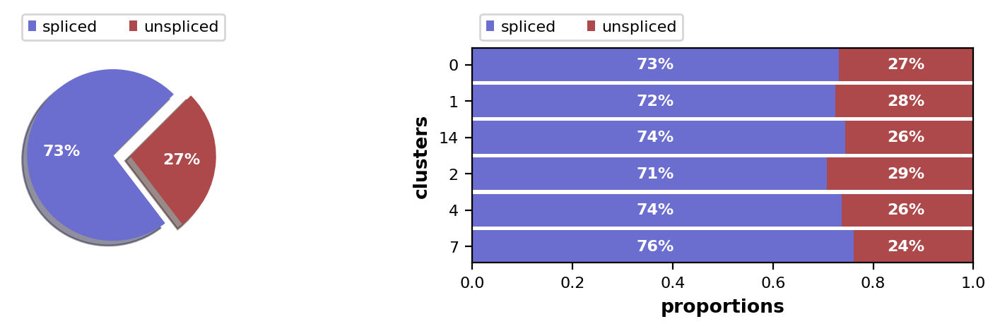

In [20]:
scv.pl.proportions(adata)

In [43]:
### Preprocess data

In [ ]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
scv.pp.log1p(adata)

In [24]:
### generate connectivities

In [25]:
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:36) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [26]:
### Estimate RNA velocity

In [ ]:
### Run latent time need
scv.tl.recover_dynamics(adata, n_jobs=8)

In [ ]:
scv.tl.velocity(adata)
scv.tl.velocity_graph(adata)

In [29]:
adata.obsm['X_umap'] = deconvolution.loc[adata.obs.index][['refine_x','refine_y']].values

In [28]:
### velocity chart

In [30]:
clust_colors = {4:'#17728C',2:'#00AECF',14:'#C1EDF6',1:'#C5E5BD',0:'#89CFC5',7:'#AA5FAC'}
adata.uns['clusters_colors'] = ['#89CFC5','#C5E5BD','#C1EDF6','#00AECF','#17728C','#AA5FAC']

## Load coordinates and ecoregion info

In [35]:
'spot cell count'
cell_count = pd.read_csv('/home/qukun/ccp1997/GBM_10X/analysis_part3/visium/totle/P77_A1/P77_A1_spot_cell_counts.csv',index_col=0)

c2l_result = pd.read_csv('/home/qukun/ccp1997/GBM_VISIUM/cell2location_with_neuron_v2/c2l_P77_A1_final_results.csv',index_col=0)
c2l_result.columns = [ item.split('_')[-1] for item in c2l_result.columns ]

c2l_result = c2l_result.loc[cell_count.index]

count_P77_A1 = pd.read_csv('/home/qukun/ccp1997/GBM_10X/analysis_part3/visium/totle/P77_A1/spot_count.csv',index_col=0)
count_P77_A1.columns = [item.split('.')[0]+'-1' for item in count_P77_A1.columns]

coordinates = pd.read_csv('/home/qukun/ccp1997/GBM_10X/analysis_part3/visium/totle/P77_A1/coordinates.csv',index_col=0)
coordinates = coordinates.loc[cell_count.index]

'P77_A1 analysis'
coordinates['row']  = [ max(coordinates['imagecol'])-(item - min(coordinates['imagecol'])) for item in coordinates['imagerow']]            
tem = pd.read_csv('/home/qukun/ccp1997/GBM_10X/analysis_part3/visium/totle/P77_A1/coordinates.csv',index_col=0)
tem = tem.loc[cell_count.index]
coordinates['row_position'] = tem['row']

norm_P77_A1 = pd.read_csv('/home/qukun/ccp1997/GBM_10X/analysis_part3/visium/totle/P77_A1/spot_norm.csv',index_col=0)  
norm_P77_A1.columns = [ item.split('.')[0] + '-1' for item in norm_P77_A1.columns]
norm_P77_A1 = norm_P77_A1[c2l_result.index]
coordinates = pd.concat([coordinates,norm_P77_A1.T],axis=1)


In [36]:
spatial_domain_table = pd.read_csv('/home/qukun/ccp1997/GBM_10X/In_depth/visium_matrix/spatial_domain_table.csv',index_col=0)

STME_list = []
for item in spatial_domain_table.index:
    if spatial_domain_table.loc[item]['spatial_domain'] in [8,2,9]:
        STME_list.append('NM')
    elif spatial_domain_table.loc[item]['spatial_domain'] in [0,4,3]:
        STME_list.append('STME-1')
    elif spatial_domain_table.loc[item]['spatial_domain'] in [7,1]:
        STME_list.append('STME-2')
    elif spatial_domain_table.loc[item]['spatial_domain'] in [5]:
        STME_list.append('STME-3')
    else:
        STME_list.append('STME-4')

spatial_domain_table['STME'] = STME_list
spatial_domain_table['slide'] = [  item.split('-')[1]  for item in spatial_domain_table.index ]

In [37]:
STME_color_dict = {'STME-1':'#DC2373','STME-2':'#5FBE9B','STME-3':'#A03826','STME-4':'#F4A947','NM':'#9B9B9B'}

In [38]:
# +2000
# +2000
# -1000
# +100
# -50
# +10
for i in range(0,adata.obsm['X_umap'].shape[0]):
    adata.obsm['X_umap'][i,1] = adata.obsm['X_umap'][i,1] + 3060

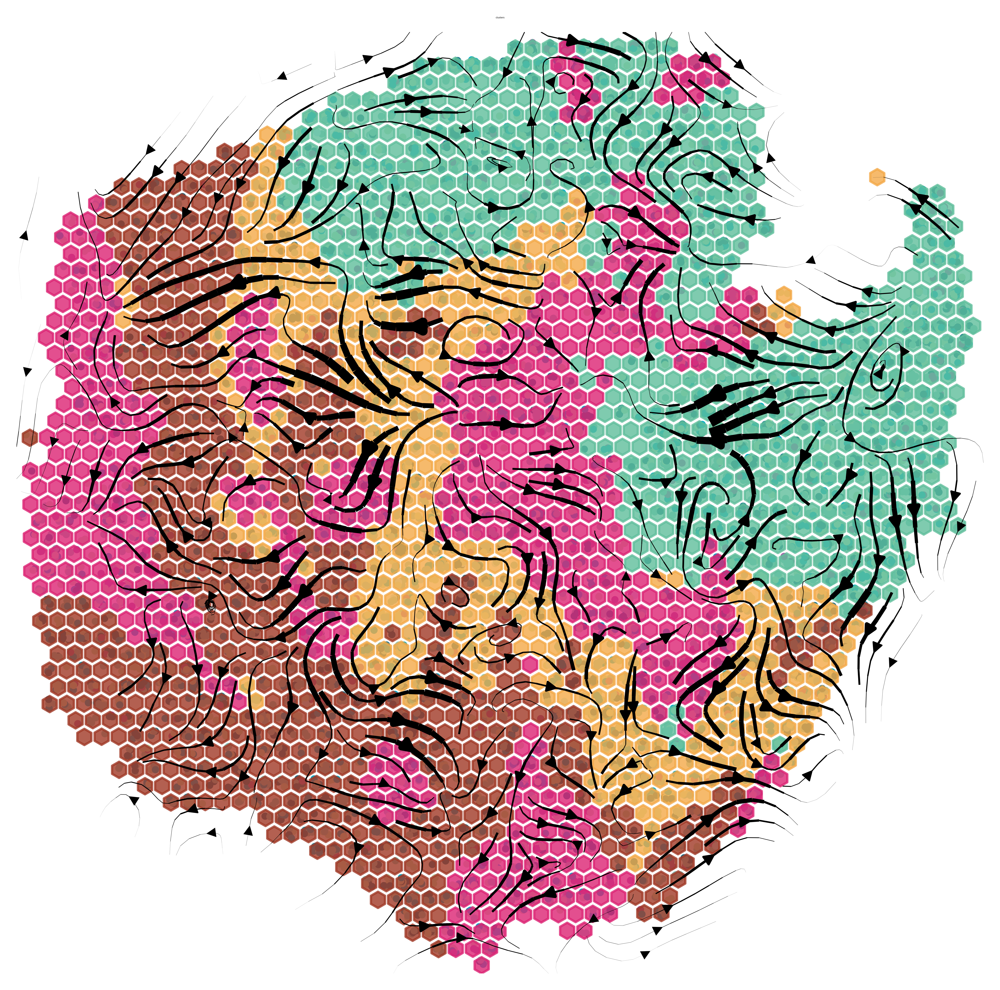

In [46]:
# plt.figure(figsize=(8,6))
scv.pl.velocity_embedding_stream(adata,show=False,basis='umap',alpha=1,figsize=(7.5,7.5),size=40,fontsize=0,legend_loc='none',smooth=1.0,min_mass=2,dpi=500,linewidth=2.5,arrow_color='#000000',outline_width=(0,0))
plt.scatter(x=coordinates['imagecol'],y=coordinates['row'],s=50,marker='h',c=spatial_domain_table.loc[coordinates.index]['STME'].map(STME_color_dict),alpha=0.80)
# plt.colorbar()
#plt.savefig('/home/qukun/ccp1997/GBM_10X/In_depth/figure/result_4/P77_A1_TAMs_scvelo.png',dpi= 500)
